# Flood Risk Classification (Admin-based)
Using Sentinel-1 ACD, DEM, Population, and Historical Flood Records

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import rasterio
import geopandas as gpd
import pandas as pd
import numpy as np

from rasterstats import zonal_stats
from shapely.geometry import Point
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

import folium
import matplotlib.pyplot as plt
import seaborn as sns


## Load Data

In [3]:
flood_src = rasterio.open("/content/drive/MyDrive/flood/banjir.tif")
dem_src   = rasterio.open("/content/drive/MyDrive/flood/dem.tif")
pop_src   = rasterio.open("/content/drive/MyDrive/flood/pop.tif")

boundary = gpd.read_file("/content/drive/MyDrive/flood/Boundary.shp").to_crs(flood_src.crs)
rivers   = gpd.read_file("/content/drive/MyDrive/flood/river.shp").to_crs(flood_src.crs)

flood_hist = pd.read_csv("/content/drive/MyDrive/flood/flood_kabupaten.csv")


In [4]:
print("Raster CRS:", flood_src.crs)
print("Boundary CRS:", boundary.crs)
print("River CRS:", rivers.crs)


Raster CRS: EPSG:4326
Boundary CRS: GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AXIS["Latitude",NORTH],AXIS["Longitude",EAST],AUTHORITY["EPSG","4326"]]
River CRS: GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AXIS["Latitude",NORTH],AXIS["Longitude",EAST],AUTHORITY["EPSG","4326"]]


In [7]:
print("Extracting zonal statistics...")

boundary["flood_mean"] = [
    s["mean"] for s in zonal_stats(
        boundary,
        "/content/drive/MyDrive/flood/banjir.tif",
        stats=["mean"],
        nodata=0
    )
]

boundary["dem_mean"] = [
    s["mean"] for s in zonal_stats(
        boundary,
        "/content/drive/MyDrive/flood/dem.tif",
        stats=["mean"],
        nodata=None
    )
]

boundary["pop_sum"] = [
    s["sum"] for s in zonal_stats(
        boundary,
        "/content/drive/MyDrive/flood/pop.tif",
        stats=["sum"],
        nodata=0
    )
]


Extracting zonal statistics...


In [8]:
centroids = boundary.geometry.centroid

# hitung jarak ke sungai terdekat
def nearest_river_dist(point, rivers):
    return rivers.distance(point).min()

boundary["dist_river"] = centroids.apply(lambda x: nearest_river_dist(x, rivers))


/tmp/ipython-input-1132389335.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroids = boundary.geometry.centroid
/tmp/ipython-input-1132389335.py:5: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  return rivers.distance(point).min()


In [10]:
boundary["KAB"] = boundary["KAB_KOTA"].str.upper()
flood_hist["KAB"] = flood_hist["kabupaten"].str.upper()

boundary = boundary.merge(
    flood_hist[["KAB", "flood_events"]],
    on="KAB",
    how="left"
)

boundary["flood_events"] = boundary["flood_events"].fillna(0)


In [11]:
# threshold sederhana (bisa kamu jelasin di metodologi)
boundary["flood_class"] = (boundary["flood_events"] > 3).astype(int)

boundary[[
    "flood_mean",
    "dem_mean",
    "pop_sum",
    "dist_river",
    "flood_class"
]].head()


,flood_mean,dem_mean,pop_sum,dist_river,flood_class
0,NaN,940.838453,-2.292974e+08,0.066783,0
1,1.0,271.412137,-2.990239e+10,0.078180,0
2,1.0,614.383784,-2.076573e+10,0.004915,0
3,1.0,380.869405,-2.880028e+10,0.013365,1
4,1.0,377.306961,-4.337527e+10,0.050701,0


In [12]:
features = [
    "flood_mean",
    "dem_mean",
    "pop_sum",
    "dist_river"
]

X = boundary[features].fillna(0)
y = boundary["flood_class"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y
)


In [13]:
model = RandomForestClassifier(
    n_estimators=200,
    max_depth=10,
    random_state=42
)

model.fit(X_train, y_train)


RandomForestClassifier(max_depth=10, n_estimators=200, random_state=42)

In [14]:
y_pred = model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))


Accuracy: 0.8888888888888888

Classification Report:

              precision    recall  f1-score   support

           0       0.89      1.00      0.94         8
           1       0.00      0.00      0.00         1

    accuracy                           0.89         9
   macro avg       0.44      0.50      0.47         9
weighted avg       0.79      0.89      0.84         9



/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


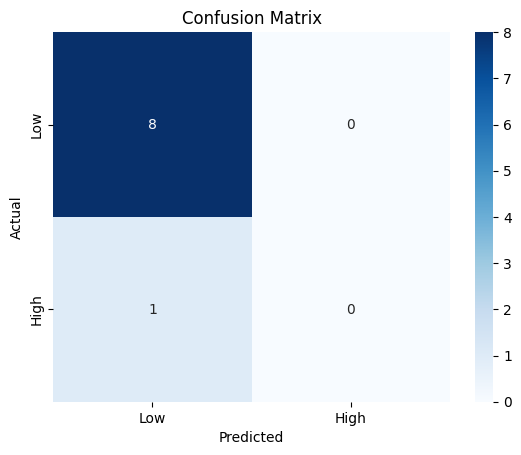

In [15]:
cm = confusion_matrix(y_test, y_pred)

sns.heatmap(
    cm, annot=True, fmt="d", cmap="Blues",
    xticklabels=["Low", "High"],
    yticklabels=["Low", "High"]
)

plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()


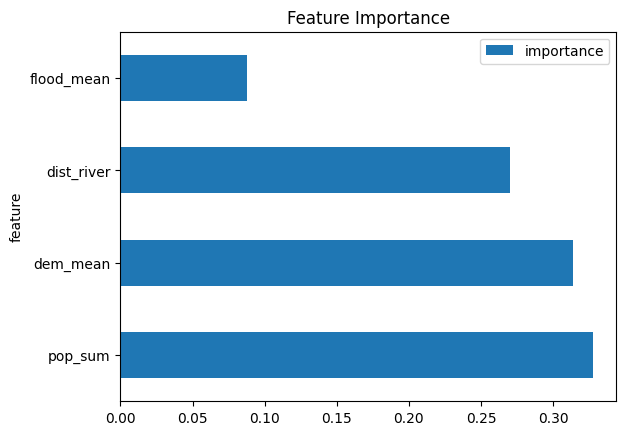

In [16]:
importance = pd.DataFrame({
    "feature": features,
    "importance": model.feature_importances_
}).sort_values("importance", ascending=False)

importance.plot(
    x="feature",
    y="importance",
    kind="barh",
    title="Feature Importance"
)
plt.show()


In [17]:
boundary["flood_pred"] = model.predict(X)


In [22]:
boundary["KAB_KOTA"] = boundary["KAB_KOTA"].astype(str).str.strip()


In [23]:
geojson = boundary.to_json()


In [24]:
m = folium.Map(location=[-2, 101], zoom_start=6)

folium.Choropleth(
    geo_data=geojson,
    data=boundary,
    columns=["KAB_KOTA", "flood_pred"],
    key_on="feature.properties.KAB_KOTA",
    fill_color="YlOrRd",
    legend_name="Predicted Flood Risk"
).add_to(m)

m
